# Current ADNI: PCA Cocycle Flow vs BrainODE

Load-only report for the current strict CN/AD, no-MCI, QC-passed SynthSeg correspondence data. Hippocampus and left lateral ventricle are analysed independently. The notebook never loads model checkpoints, performs inference, writes caches, or changes meshes.

Use the test split for primary claims. Positive paired differences always favour **PCA Cocycle Flow**.

## Build the two read-only caches

Run one command for each structure before opening this notebook. The cache builder checks split/PCA/checkpoint provenance and never modifies source meshes or training outputs.

```bash
PY=/home/jakaria/anaconda3/envs/inr_sdf/bin/python
$PY scripts/build_adni_pca_cocycle_flow_vs_brainode_cache.py --structure hippocampus --device cuda:0
$PY scripts/build_adni_pca_cocycle_flow_vs_brainode_cache.py --structure lateral_ventricle --device cuda:1
```

Use two different available GPUs for parallel execution; otherwise run the commands sequentially.

In [2]:
from __future__ import annotations

import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Markdown, display

try:
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
except ImportError:
    go = None
    make_subplots = None

def find_repo_root(start: Path) -> Path:
    for candidate in (start, *start.parents):
        if (candidate / '.git').exists():
            return candidate
    raise RuntimeError('Could not find repository root')

REPO_ROOT = find_repo_root(Path.cwd().resolve())
REPORT_ROOT = REPO_ROOT / 'examples/ADNI_1_LHipp_LLV_No_MCI_synthseg_minimal_smooth/longitudinal_model_validation/pca_cocycle_flow_vs_paper_core_brainode'
CACHE_ROOT = REPORT_ROOT / 'prepared_cache'
STRUCTURES = ('hippocampus', 'lateral_ventricle')
STRUCTURE_LABELS = {'hippocampus': 'Left hippocampus', 'lateral_ventricle': 'Left lateral ventricle'}
MODEL_LABELS = {'brainode': 'BrainODE', 'cocycle_flow': 'PCA Cocycle Flow'}
MODEL_COLORS = {'brainode': '#6C757D', 'cocycle_flow': '#0072B2', 'observed': '#111111'}
METRIC_ORDER = ('endpoint_vertex_mae_mm', 'endpoint_vertex_euclidean_mm', 'endpoint_vertex_hd95_mm', 'endpoint_pca_mse', 'volume_relative_error', 'log_volume_rate_abs_error', 'local_normal_rate_mae', 'local_normal_rate_pearson', 'local_normal_top_change_dice')
TABLE_NAMES = ('cohort_counts', 'per_pair_metrics', 'metric_summary', 'paired_metric_comparison', 'paired_bootstrap_ci', 'gap_summary', 'subject_volume_trends', 'cohort_volume_trend_summary', 'cohort_volume_curve', 'selected_volume_trajectories', 'counterfactual_trajectories', 'selected_mesh_metrics', 'group_hotspot_metrics')

def load_bundle(structure: str) -> dict:
    cache = CACHE_ROOT / structure
    manifest_path = cache / 'manifest.json'
    if not manifest_path.is_file():
        raise FileNotFoundError(f'Missing {structure} cache. Run the cache-builder command above: {manifest_path}')
    manifest = json.loads(manifest_path.read_text(encoding='utf-8'))
    if manifest.get('status') != 'complete':
        raise RuntimeError(f'{structure} cache is not complete: {manifest.get("status")}')
    tables = {name: pd.read_csv(cache / 'tables' / f'{name}.csv') for name in TABLE_NAMES}
    # Older completed caches used the longer historical label. Normalise only presentation labels.
    for table in tables.values():
        for column in table.select_dtypes(include='object').columns:
            table[column] = table[column].replace({'paper-core BrainODE': 'BrainODE'})
    return {'cache': cache, 'manifest': manifest, 'selected': json.loads((cache / 'selected_examples.json').read_text(encoding='utf-8')), 'tables': tables}

bundles = {structure: load_bundle(structure) for structure in STRUCTURES}
for structure, bundle in bundles.items():
    print(f"{STRUCTURE_LABELS[structure]}: {bundle['cache']} | pairs={bundle['manifest']['rows']['per_pair']} | group maps={bundle['manifest']['group_maps']}")

plt.rcParams.update({'figure.dpi': 120, 'font.size': 10, 'axes.titlesize': 12, 'axes.labelsize': 10, 'legend.fontsize': 9})
pd.set_option('display.max_columns', 40)

Left hippocampus: /home/jakaria/INR/Deep3DComp/examples/ADNI_1_LHipp_LLV_No_MCI_synthseg_minimal_smooth/longitudinal_model_validation/pca_cocycle_flow_vs_paper_core_brainode/prepared_cache/hippocampus | pairs=10752 | group maps=complete
Left lateral ventricle: /home/jakaria/INR/Deep3DComp/examples/ADNI_1_LHipp_LLV_No_MCI_synthseg_minimal_smooth/longitudinal_model_validation/pca_cocycle_flow_vs_paper_core_brainode/prepared_cache/lateral_ventricle | pairs=10792 | group maps=complete


## Cohort and contract audit

Both methods use the same fixed structure-specific PCA basis and current QC-passed, strict no-MCI archives. The cache manifest records the test-isolation and source-mesh contract.

In [3]:
for structure, bundle in bundles.items():
    display(Markdown(f"### {STRUCTURE_LABELS[structure]}"))
    display(bundle['tables']['cohort_counts'].sort_values(['split', 'diagnosis', 'model']).reset_index(drop=True))
    display(pd.DataFrame(bundle['selected']).T)
    provenance = json.loads((bundle['cache'] / 'provenance.json').read_text(encoding='utf-8'))
    display(Markdown(f"- Strict no-MCI: `{provenance['strict_no_mci']}`  \
- Test isolated during training: `{not provenance['test_loaded_during_training']}`  \
- Source meshes modified: `{provenance['source_meshes_modified']}`"))

### Left hippocampus

,split,diagnosis,model,model_label,pairs,subjects
0,all,AD,brainode,BrainODE,1107,271
1,all,AD,cocycle_flow,PCA Cocycle Flow,1107,271
2,all,CN,brainode,BrainODE,4269,326
3,all,CN,cocycle_flow,PCA Cocycle Flow,4269,326
4,test,AD,brainode,BrainODE,118,28
5,test,AD,cocycle_flow,PCA Cocycle Flow,118,28
6,test,CN,brainode,BrainODE,501,33
7,test,CN,cocycle_flow,PCA Cocycle Flow,501,33
8,train,AD,brainode,BrainODE,863,215
9,train,AD,cocycle_flow,PCA Cocycle Flow,863,215


,diagnosis,future_visits,maximum_followup_years,selection_rule,split,subject_id
AD,AD,4,2.99247,"most follow-up visits, then longest follow-up,...",test,995
CN,CN,10,10.255989,"most follow-up visits, then longest follow-up,...",test,31


- Strict no-MCI: `True`  - Test isolated during training: `True`  - Source meshes modified: `False`

### Left lateral ventricle

,split,diagnosis,model,model_label,pairs,subjects
0,all,AD,brainode,BrainODE,1136,276
1,all,AD,cocycle_flow,PCA Cocycle Flow,1136,276
2,all,CN,brainode,BrainODE,4260,323
3,all,CN,cocycle_flow,PCA Cocycle Flow,4260,323
4,test,AD,brainode,BrainODE,115,28
5,test,AD,cocycle_flow,PCA Cocycle Flow,115,28
6,test,CN,brainode,BrainODE,513,33
7,test,CN,cocycle_flow,PCA Cocycle Flow,513,33
8,train,AD,brainode,BrainODE,895,220
9,train,AD,cocycle_flow,PCA Cocycle Flow,895,220


,diagnosis,future_visits,maximum_followup_years,selection_rule,split,subject_id
AD,AD,4,2.99247,"most follow-up visits, then longest follow-up,...",test,995
CN,CN,10,10.255989,"most follow-up visits, then longest follow-up,...",test,31


- Strict no-MCI: `True`  - Test isolated during training: `True`  - Source meshes modified: `False`

## Primary matched-pair test comparison

Each bar compares exactly the same forward source/target pairs. The colour labels are placed in a reserved band above the tallest bar, so they do not overlap the plotted values.

### Left hippocampus — numeric test summary

,diagnosis,metric_label,direction_symbol,pairs,brainode_mean,cocycle_flow_mean,delta_favoring_cocycle_flow_mean,cocycle_flow_win_fraction,better_model
20,AD,Corresponding-vertex HD95 (mm),↓,118,0.66637,0.66020,0.00617,0.63559,PCA Cocycle Flow
22,AD,Local normal-rate MAE,↓,118,0.27198,0.26985,0.00213,0.61017,PCA Cocycle Flow
23,AD,Local normal-rate Pearson,↑,118,0.18368,0.18242,-0.00126,0.55085,BrainODE
25,AD,Log-volume-rate error,↓,118,0.04123,0.03625,0.00498,0.61017,PCA Cocycle Flow
18,AD,PCA MSE,↓,118,0.72873,0.72308,0.00564,0.54237,PCA Cocycle Flow
24,AD,Top-change Dice,↑,118,0.29471,0.29168,-0.00304,0.48305,BrainODE
19,AD,Vertex Euclidean distance (mm),↓,118,0.31812,0.31499,0.00313,0.61864,PCA Cocycle Flow
21,AD,Vertex MAE (mm),↓,118,0.15952,0.15793,0.00159,0.63559,PCA Cocycle Flow
26,AD,Volume relative error,↓,118,0.03733,0.03204,0.00529,0.61017,PCA Cocycle Flow
29,CN,Corresponding-vertex HD95 (mm),↓,501,0.63284,0.62157,0.01127,0.56287,PCA Cocycle Flow


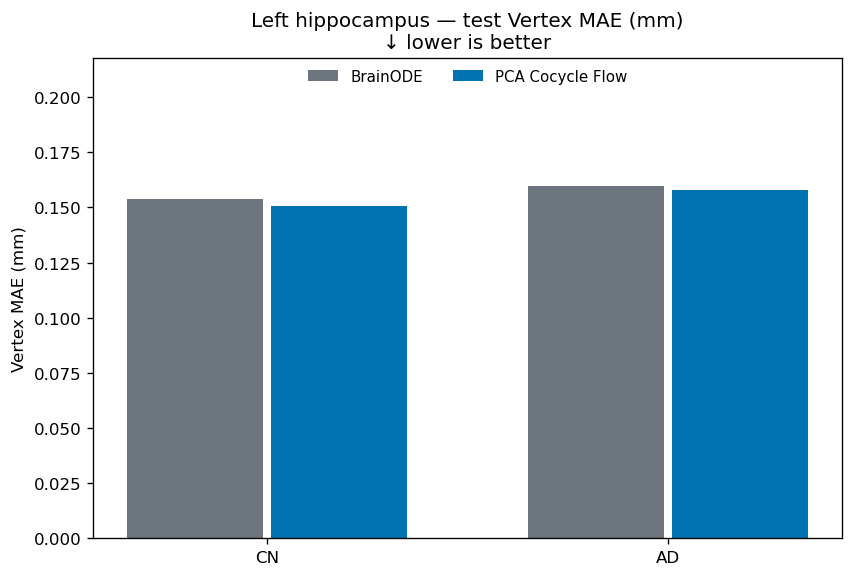

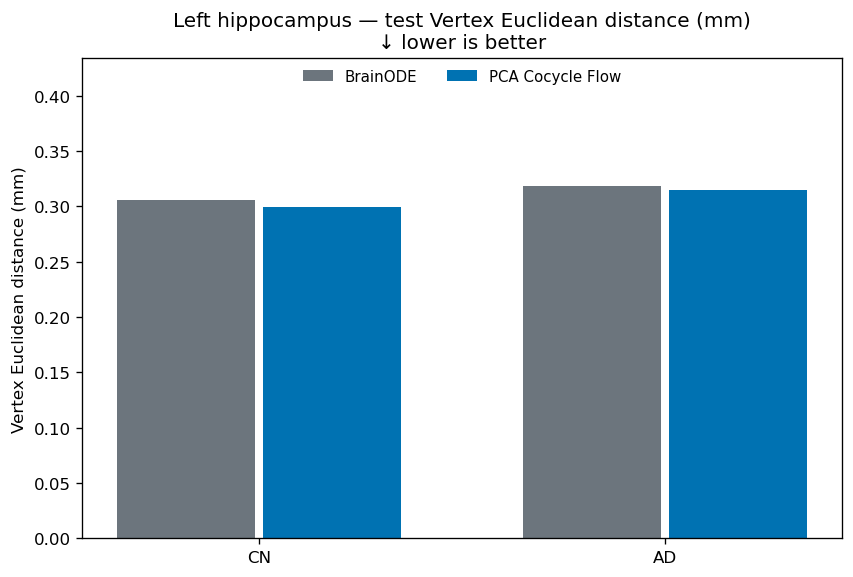

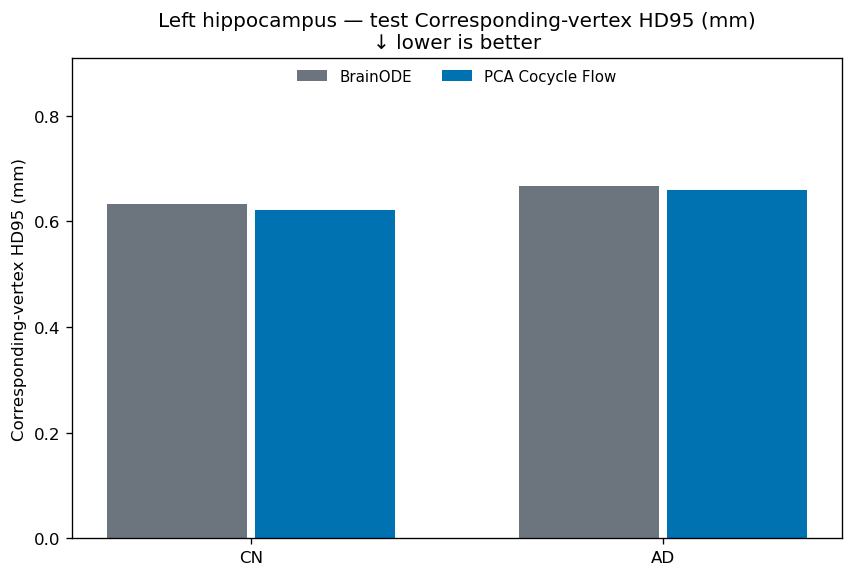

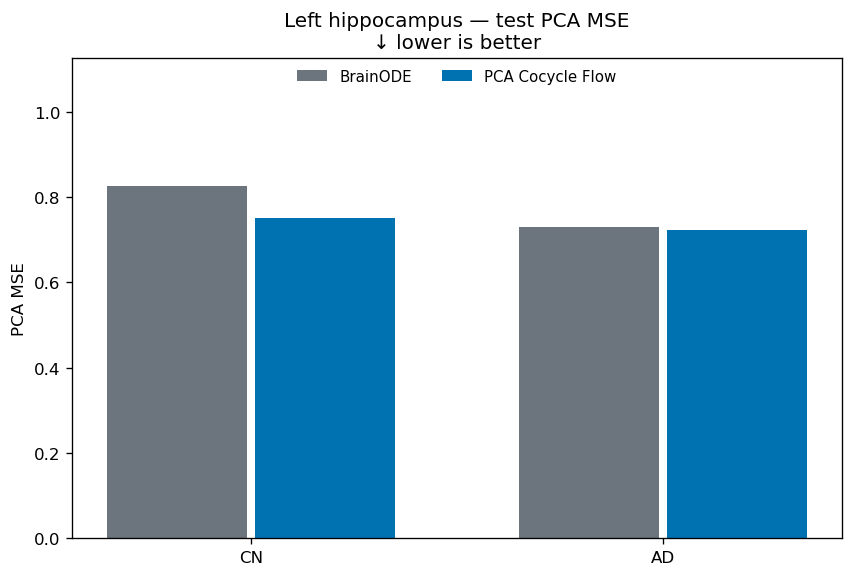

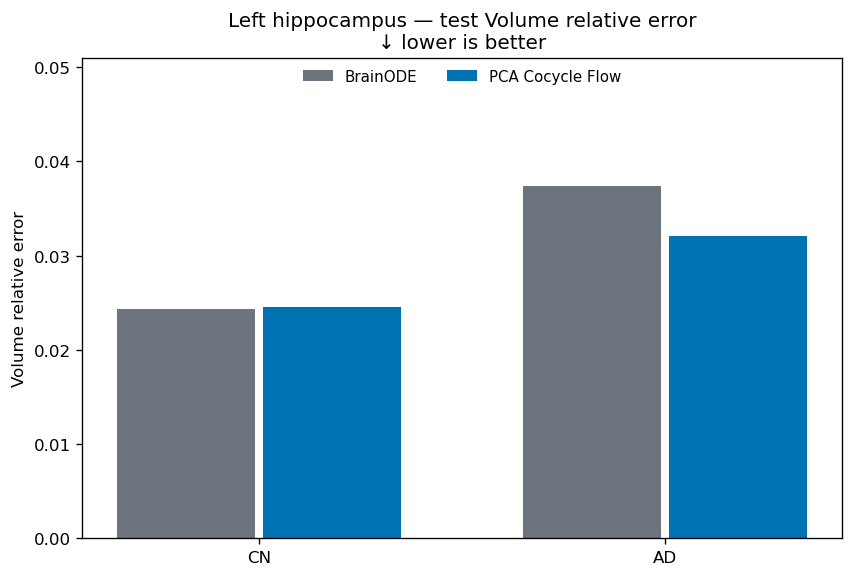

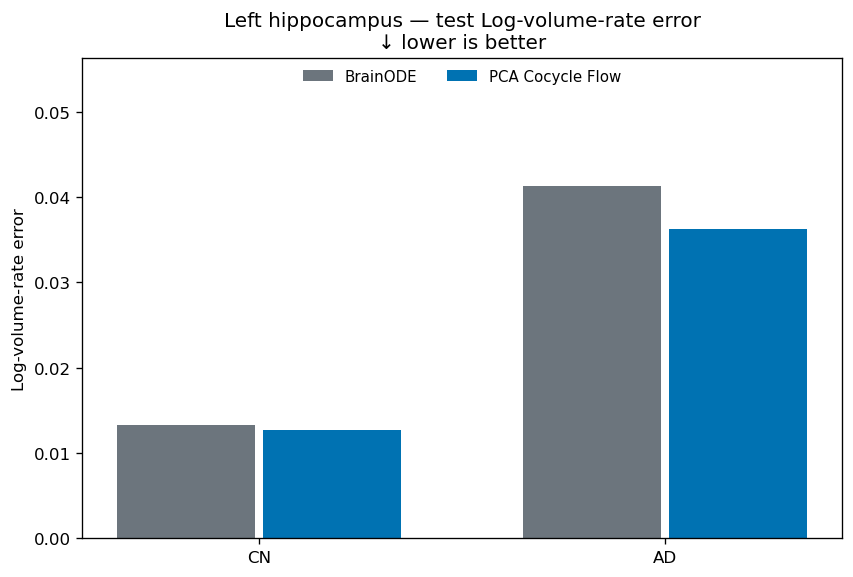

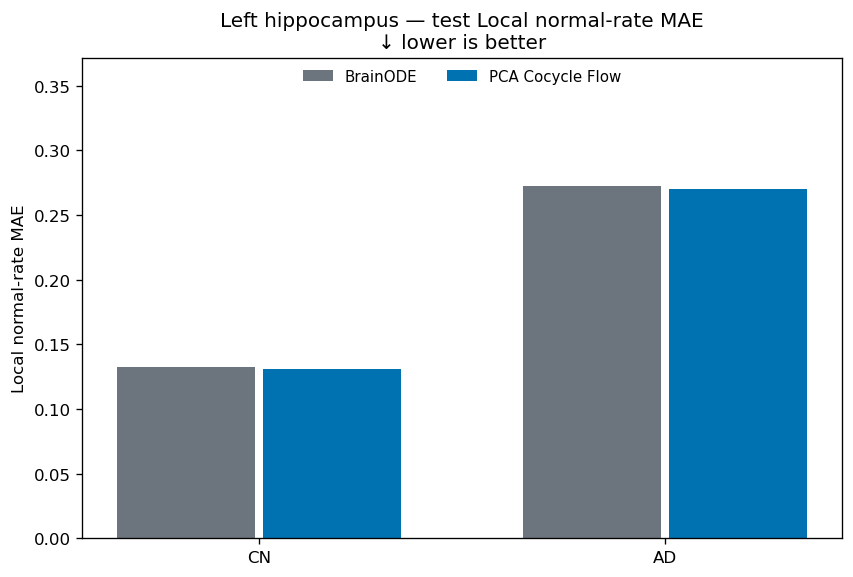

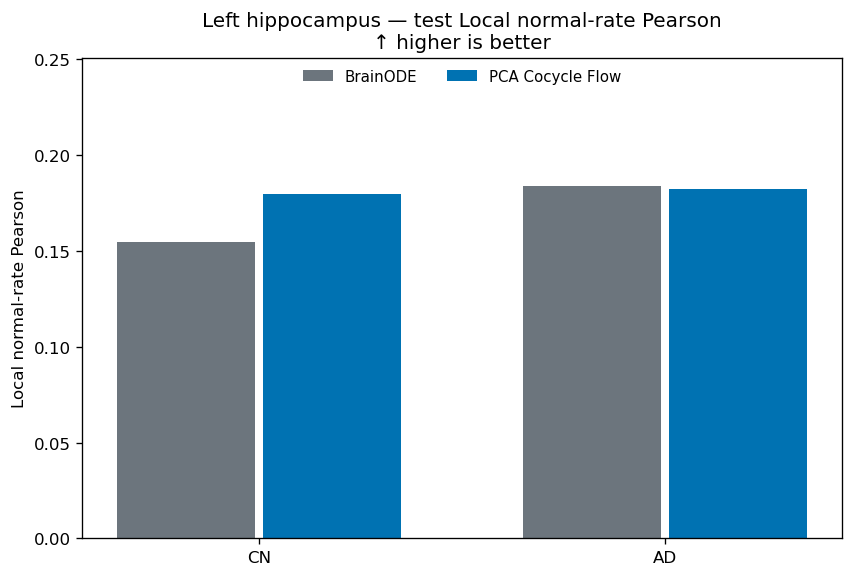

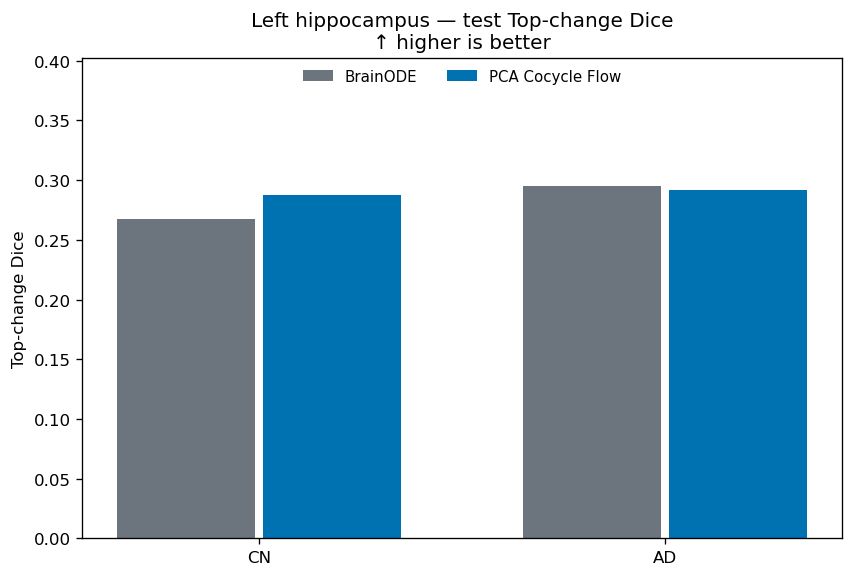

### Left lateral ventricle — numeric test summary

,diagnosis,metric_label,direction_symbol,pairs,brainode_mean,cocycle_flow_mean,delta_favoring_cocycle_flow_mean,cocycle_flow_win_fraction,better_model
20,AD,Corresponding-vertex HD95 (mm),↓,115,1.32578,1.29774,0.02804,0.56522,PCA Cocycle Flow
22,AD,Local normal-rate MAE,↓,115,0.58651,0.57723,0.00928,0.60000,PCA Cocycle Flow
23,AD,Local normal-rate Pearson,↑,115,0.13609,0.17046,0.03437,0.56522,PCA Cocycle Flow
25,AD,Log-volume-rate error,↓,115,0.06834,0.05536,0.01298,0.60000,PCA Cocycle Flow
18,AD,PCA MSE,↓,115,0.43326,0.38050,0.05277,0.90435,PCA Cocycle Flow
24,AD,Top-change Dice,↑,115,0.24454,0.26971,0.02518,0.60000,PCA Cocycle Flow
19,AD,Vertex Euclidean distance (mm),↓,115,0.70381,0.69434,0.00948,0.59130,PCA Cocycle Flow
21,AD,Vertex MAE (mm),↓,115,0.35177,0.34742,0.00435,0.58261,PCA Cocycle Flow
26,AD,Volume relative error,↓,115,0.05815,0.04814,0.01000,0.60000,PCA Cocycle Flow
29,CN,Corresponding-vertex HD95 (mm),↓,513,1.38237,1.37503,0.00733,0.56725,PCA Cocycle Flow


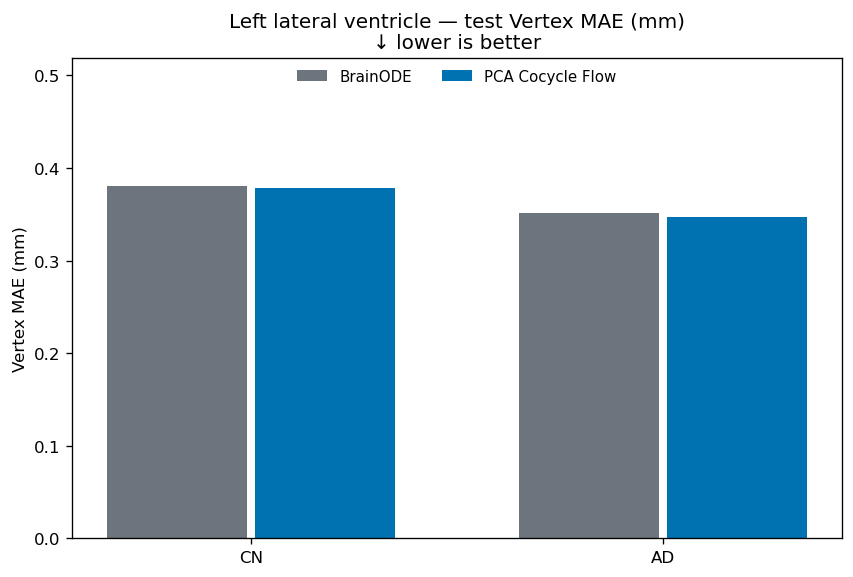

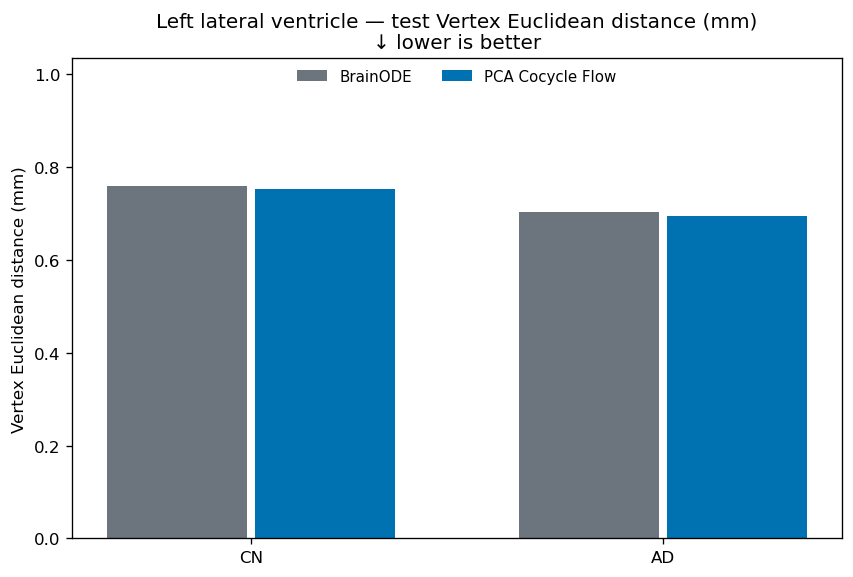

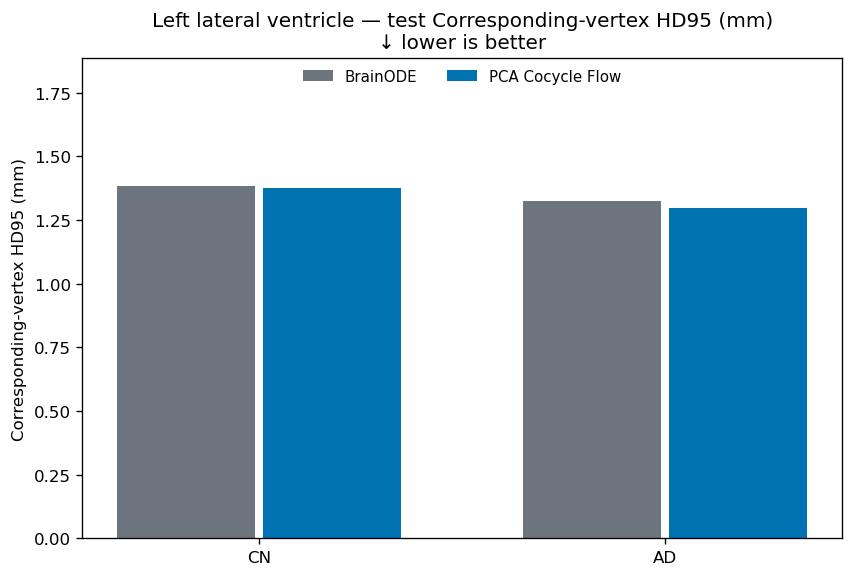

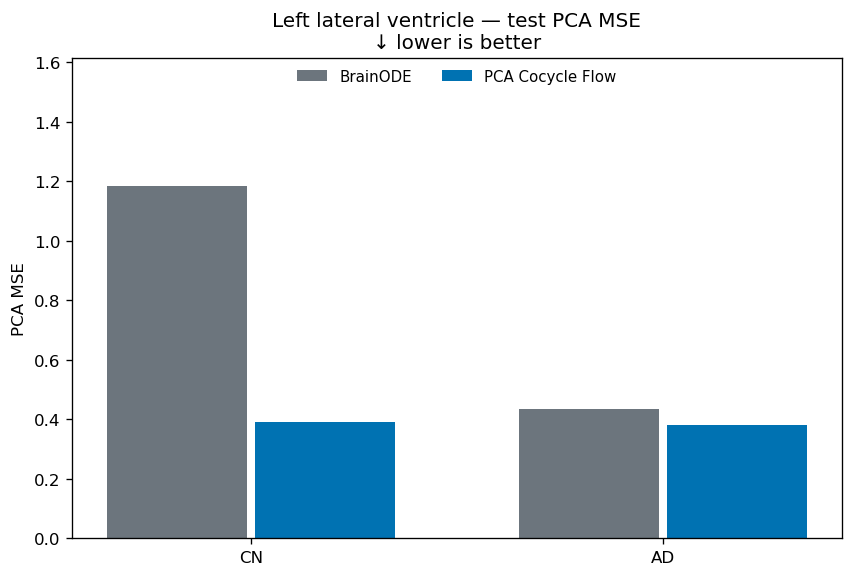

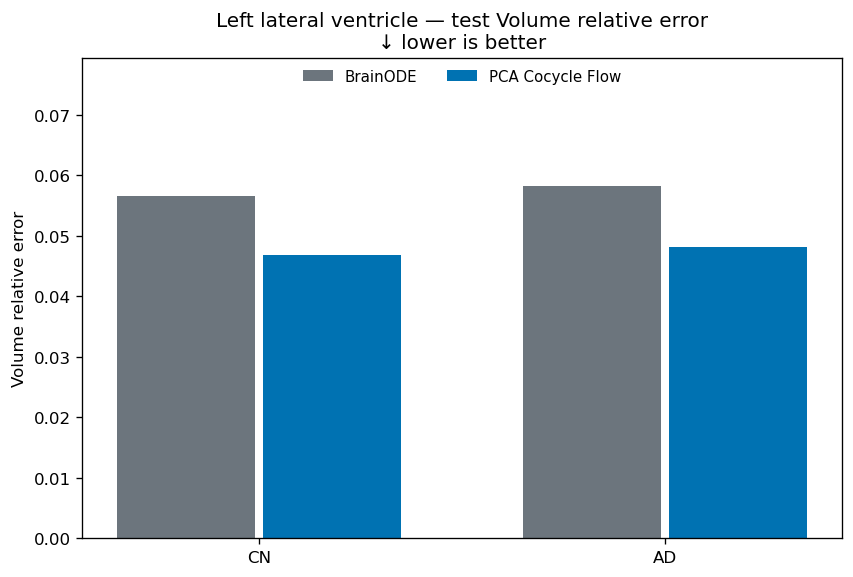

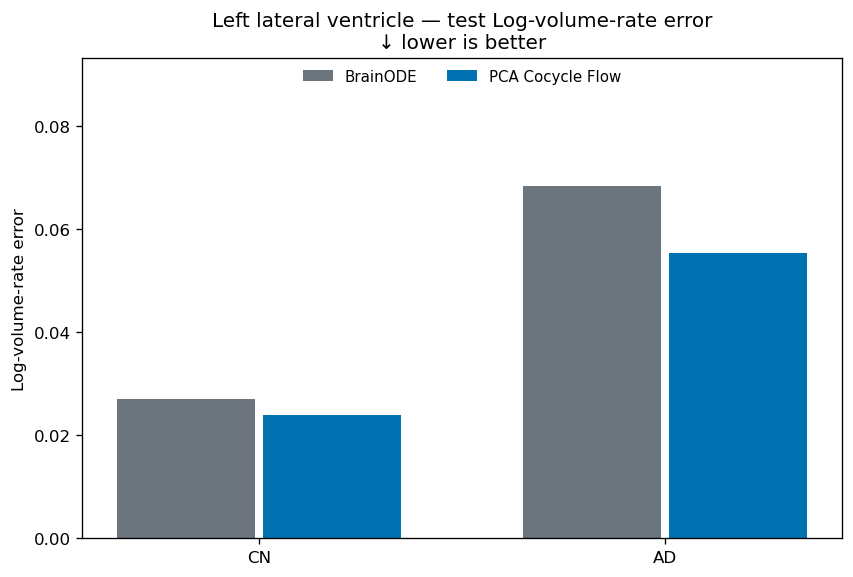

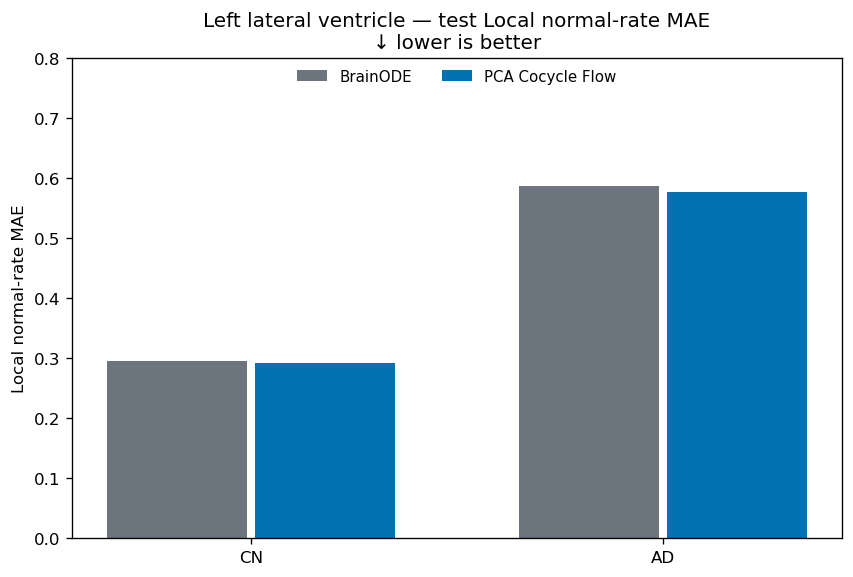

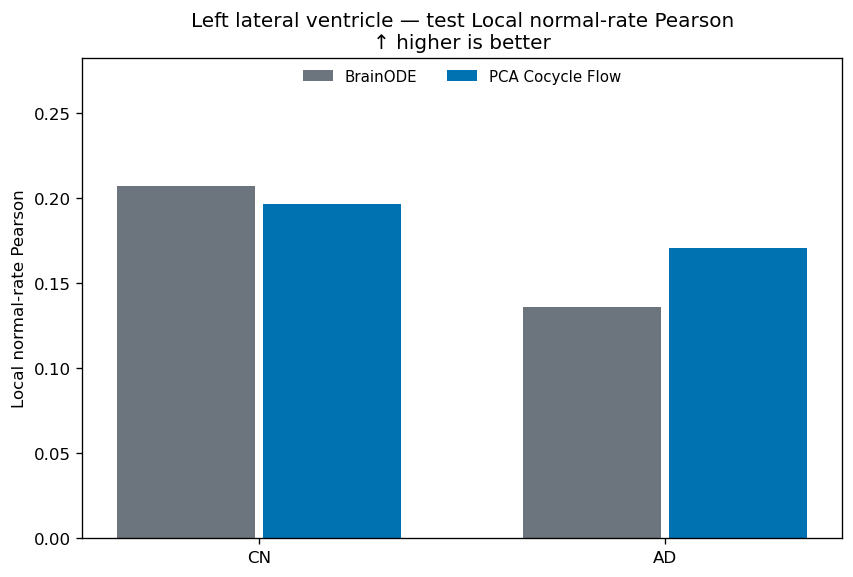

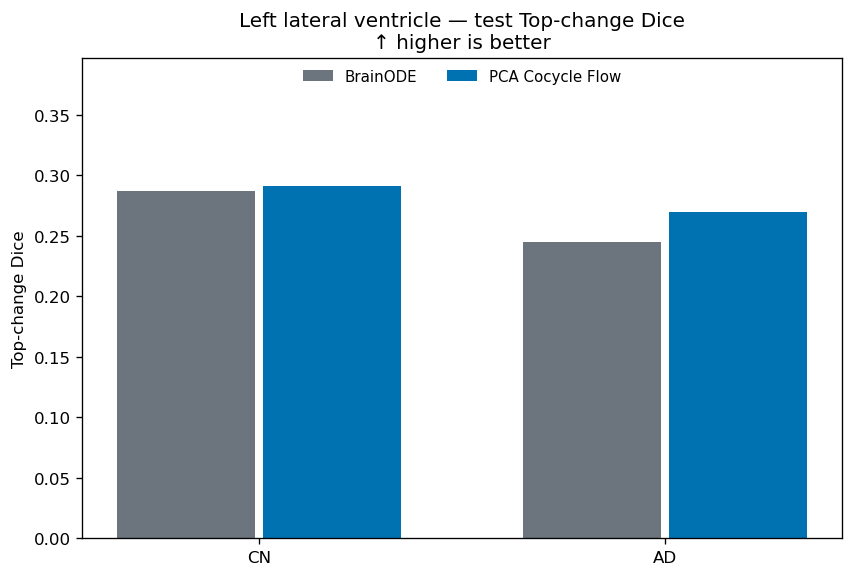

In [4]:
def metric_bar_chart(structure: str, metric: str) -> None:
    data = bundles[structure]['tables']['metric_summary']
    data = data[(data['split'] == 'test') & (data['metric'] == metric)].copy()
    if data.empty:
        return
    diagnoses = [dx for dx in ('CN', 'AD') if dx in set(data['diagnosis'])]
    label = data['metric_label'].iloc[0]
    direction = data['direction'].iloc[0]
    fig, ax = plt.subplots(figsize=(7.0, 4.7), constrained_layout=True)
    positions = np.arange(len(diagnoses), dtype=float)
    for shift, (column, model) in zip((-0.18, 0.18), (('brainode_mean', 'brainode'), ('cocycle_flow_mean', 'cocycle_flow'))):
        values = [float(data.loc[data['diagnosis'] == dx, column].iloc[0]) for dx in diagnoses]
        ax.bar(positions + shift, values, width=0.34, color=MODEL_COLORS[model], label=MODEL_LABELS[model])
    ax.set_xticks(positions, diagnoses)
    ax.set_ylabel(label)
    arrow = '↓ lower is better' if direction == 'lower' else '↑ higher is better'
    ax.set_title(f"{STRUCTURE_LABELS[structure]} — test {label}\n{arrow}")
    # Explicit headroom makes the in-axis colour legend independent of bar height.
    lower, upper = ax.get_ylim()
    tallest = max((patch.get_height() for patch in ax.patches), default=upper)
    headroom = max(0.30 * (upper - lower), 0.12 * max(abs(tallest), 1.0e-8))
    ax.set_ylim(lower, max(upper, tallest) + headroom)
    ax.legend(frameon=False, loc='upper center', bbox_to_anchor=(0.5, 0.99), ncol=2, borderaxespad=0.0)
    ax.grid(axis='x', visible=False)
    plt.show()

for structure, bundle in bundles.items():
    display(Markdown(f"### {STRUCTURE_LABELS[structure]} — numeric test summary"))
    test = bundle['tables']['metric_summary'].query("split == 'test'").copy()
    display(test[['diagnosis', 'metric_label', 'direction_symbol', 'pairs', 'brainode_mean', 'cocycle_flow_mean', 'delta_favoring_cocycle_flow_mean', 'cocycle_flow_win_fraction', 'better_model']].sort_values(['diagnosis', 'metric_label']).round(5))
    for metric in METRIC_ORDER:
        metric_bar_chart(structure, metric)

## Paired improvement and uncertainty

Bootstrap intervals resample subjects rather than repeated pairs. Positive values and positive confidence intervals favour PCA Cocycle Flow.

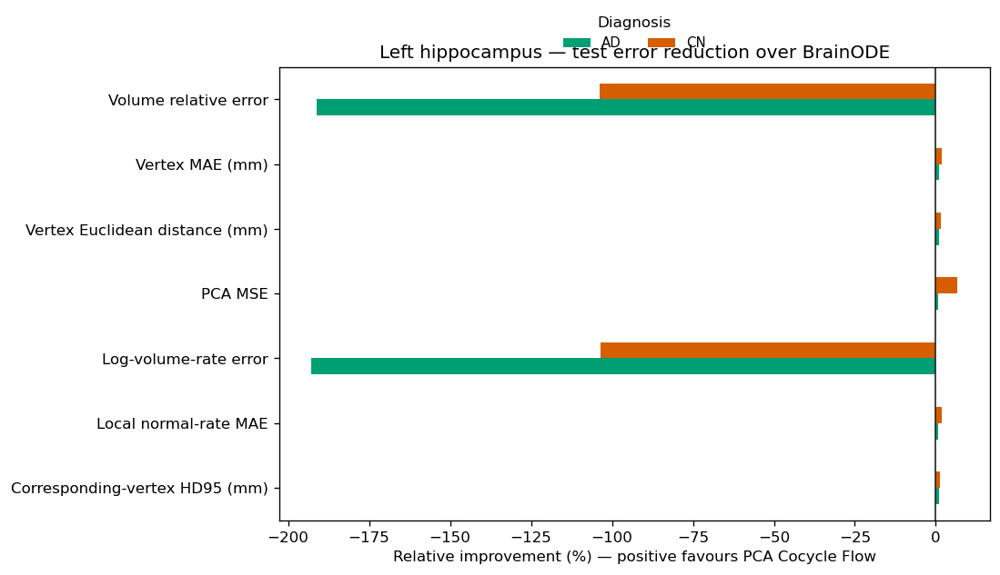

,split,diagnosis,metric,metric_label,subjects,replicates,delta_favoring_cocycle_flow_mean,ci_low,ci_high,probability_cocycle_flow_better
0,test,AD,endpoint_pca_mse,PCA MSE,28,2000,0.006092,0.001617,0.010702,0.9970
1,test,AD,endpoint_vertex_euclidean_mm,Vertex Euclidean distance (mm),28,2000,0.002814,0.000438,0.005431,0.9910
2,test,AD,endpoint_vertex_hd95_mm,Corresponding-vertex HD95 (mm),28,2000,0.005148,-0.000608,0.010867,0.9560
3,test,AD,endpoint_vertex_mae_mm,Vertex MAE (mm),28,2000,0.001393,0.000155,0.002745,0.9850
4,test,AD,local_normal_rate_mae,Local normal-rate MAE,28,2000,0.001815,-0.000217,0.003916,0.9560
5,test,AD,local_normal_rate_pearson,Local normal-rate Pearson,28,2000,0.001889,-0.028353,0.029632,0.5760
6,test,AD,local_normal_top_change_dice,Top-change Dice,28,2000,-0.000041,-0.015431,0.014937,0.5165
7,test,AD,log_volume_rate_abs_error,Log-volume-rate error,28,2000,0.004764,0.000427,0.009043,0.9840
8,test,AD,volume_relative_error,Volume relative error,28,2000,0.004632,0.001097,0.008152,0.9955
9,test,CN,endpoint_pca_mse,PCA MSE,33,2000,0.043077,0.026139,0.062133,1.0000


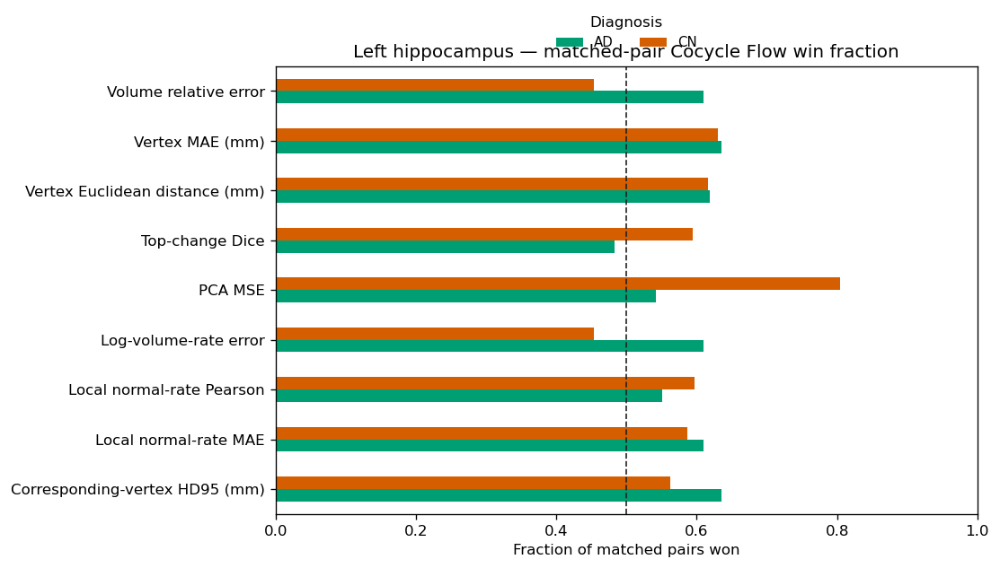

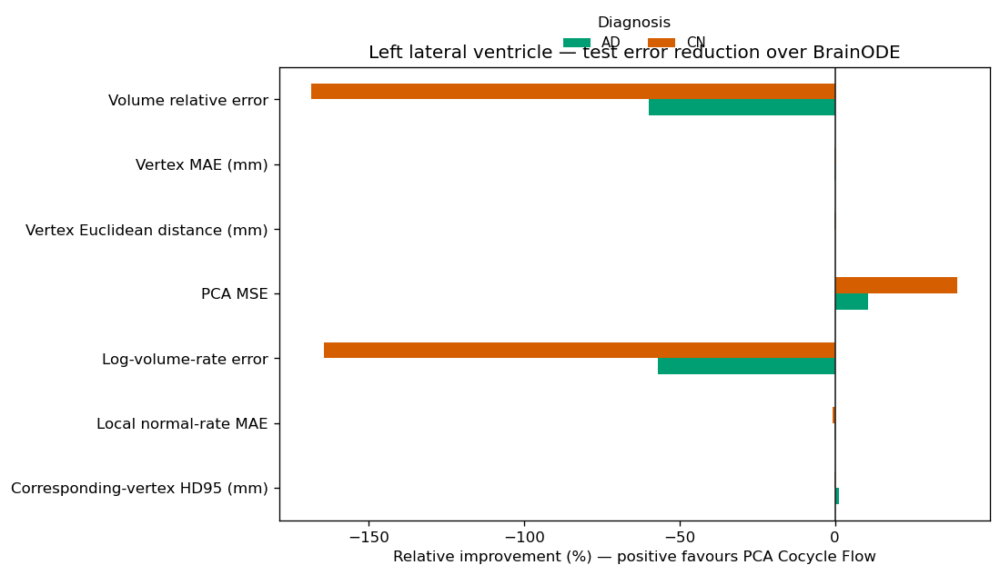

,split,diagnosis,metric,metric_label,subjects,replicates,delta_favoring_cocycle_flow_mean,ci_low,ci_high,probability_cocycle_flow_better
0,test,AD,endpoint_pca_mse,PCA MSE,28,2000,0.039822,0.023850,0.058413,1.0000
1,test,AD,endpoint_vertex_euclidean_mm,Vertex Euclidean distance (mm),28,2000,0.010649,-0.012958,0.033940,0.8330
2,test,AD,endpoint_vertex_hd95_mm,Corresponding-vertex HD95 (mm),28,2000,0.022939,-0.015784,0.059947,0.8875
3,test,AD,endpoint_vertex_mae_mm,Vertex MAE (mm),28,2000,0.005188,-0.006475,0.017265,0.8110
4,test,AD,local_normal_rate_mae,Local normal-rate MAE,28,2000,0.014417,-0.004858,0.033017,0.9270
5,test,AD,local_normal_rate_pearson,Local normal-rate Pearson,28,2000,0.012765,-0.062761,0.084035,0.6485
6,test,AD,local_normal_top_change_dice,Top-change Dice,28,2000,0.021384,-0.016686,0.057830,0.8665
7,test,AD,log_volume_rate_abs_error,Log-volume-rate error,28,2000,0.013616,0.002179,0.024939,0.9905
8,test,AD,volume_relative_error,Volume relative error,28,2000,0.009372,-0.001275,0.021011,0.9590
9,test,CN,endpoint_pca_mse,PCA MSE,33,2000,0.462836,0.223509,0.762897,1.0000


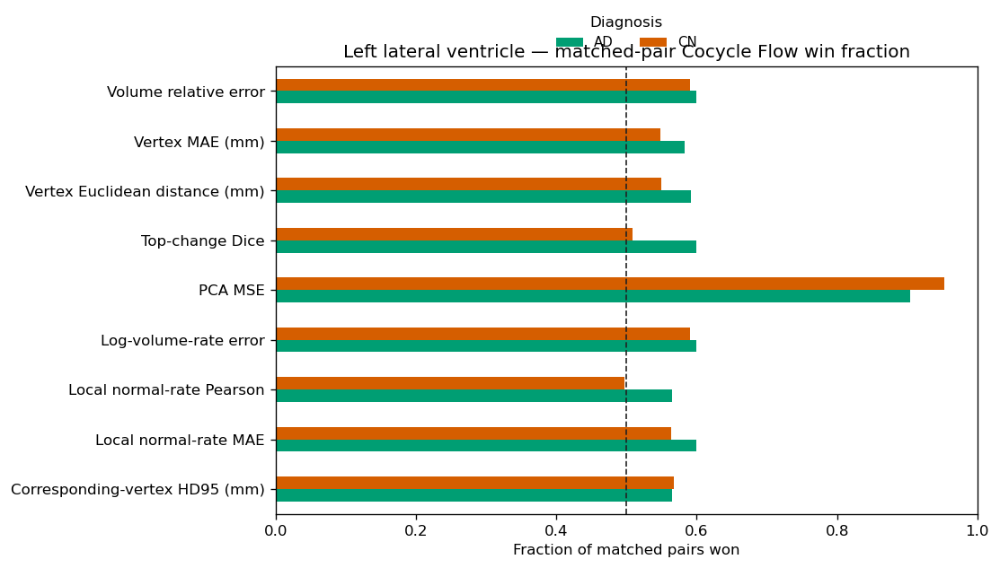

In [5]:
for structure, bundle in bundles.items():
    test = bundle['tables']['metric_summary'].query("split == 'test'").copy()
    errors = test[test['direction'] == 'lower'].pivot(index='metric_label', columns='diagnosis', values='relative_gain_percent')
    ax = errors.plot.barh(figsize=(8.4, 5.4), color=['#009E73', '#D55E00'])
    ax.axvline(0, color='#222222', linewidth=1)
    ax.set_title(f"{STRUCTURE_LABELS[structure]} — test error reduction over BrainODE")
    ax.set_xlabel('Relative improvement (%) — positive favours PCA Cocycle Flow')
    ax.set_ylabel('')
    ax.legend(title='Diagnosis', frameon=False, loc='lower center', bbox_to_anchor=(0.5, 1.01), ncol=2)
    plt.show()
    display(bundle['tables']['paired_bootstrap_ci'].query("split == 'test'").sort_values(['diagnosis', 'metric']).reset_index(drop=True))
    wins = test.pivot(index='metric_label', columns='diagnosis', values='cocycle_flow_win_fraction')
    ax = wins.plot.barh(figsize=(8.4, 5.4), color=['#009E73', '#D55E00'])
    ax.axvline(0.5, color='#222222', linestyle='--', linewidth=1)
    ax.set_xlim(0, 1)
    ax.set_title(f"{STRUCTURE_LABELS[structure]} — matched-pair Cocycle Flow win fraction")
    ax.set_xlabel('Fraction of matched pairs won')
    ax.set_ylabel('')
    ax.legend(title='Diagnosis', frameon=False, loc='lower center', bbox_to_anchor=(0.5, 1.01), ncol=2)
    plt.show()

## Follow-up-gap dependence

The AD test results below separate adjacent, short, and long prediction intervals.

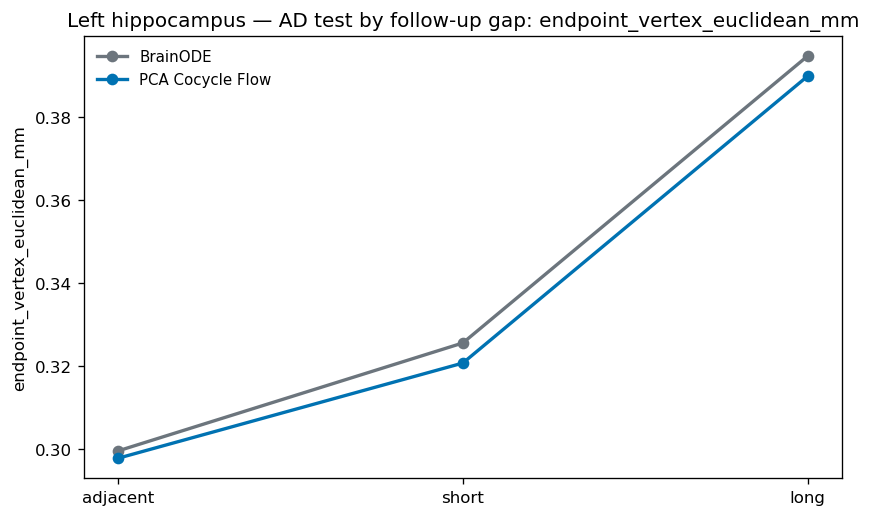

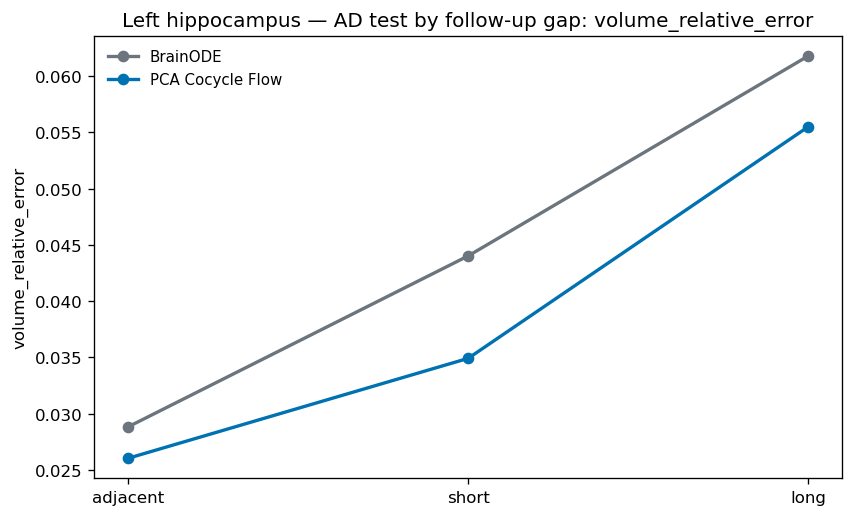

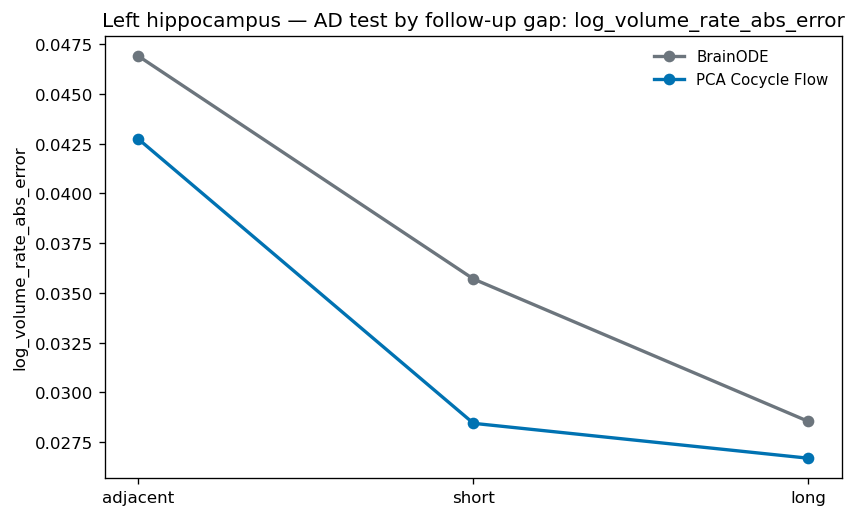

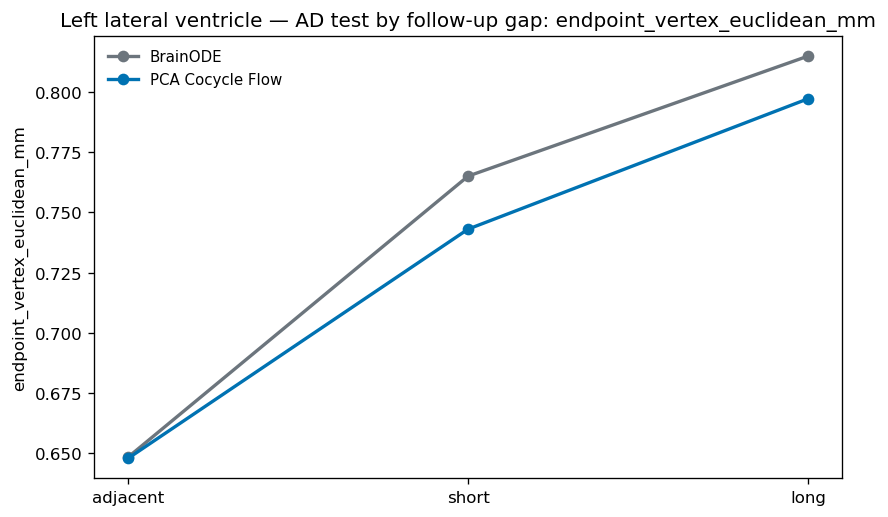

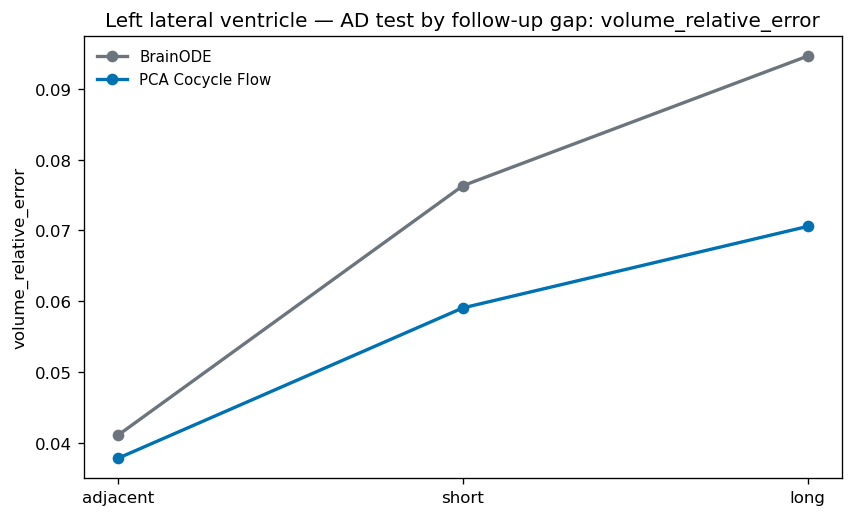

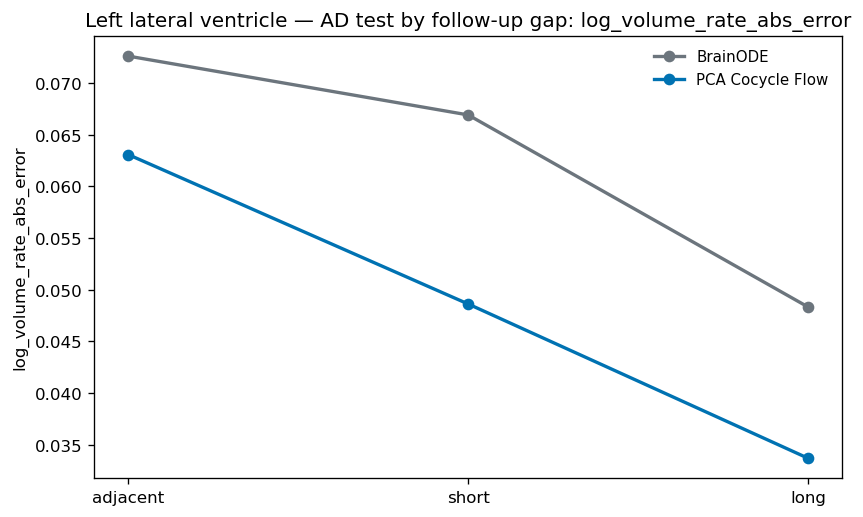

In [6]:
for structure, bundle in bundles.items():
    gap = bundle['tables']['gap_summary'].query("split == 'test' and diagnosis == 'AD'")
    for metric in ('endpoint_vertex_euclidean_mm', 'volume_relative_error', 'log_volume_rate_abs_error'):
        data = gap[['gap_bin', 'model', metric]].copy()
        order = [name for name in ('adjacent', 'short', 'long') if name in set(data['gap_bin'])]
        fig, ax = plt.subplots(figsize=(7.0, 4.2), constrained_layout=True)
        for model in ('brainode', 'cocycle_flow'):
            current = data[data['model'] == model].set_index('gap_bin').reindex(order)
            ax.plot(order, current[metric], marker='o', linewidth=2, color=MODEL_COLORS[model], label=MODEL_LABELS[model])
        ax.set_title(f"{STRUCTURE_LABELS[structure]} — AD test by follow-up gap: {metric}")
        ax.set_ylabel(metric)
        ax.legend(frameon=False)
        plt.show()

## Group volume trends, individual slopes, and speed

Volumes are relative to each subject's own baseline. The number of contributing subjects is labelled at every time bin, which is essential when interpreting sparse late follow-up.

### Left hippocampus — individual slopes

,diagnosis,model_label,subjects,observed_slope_mean,predicted_slope_mean,slope_absolute_error_mean,slope_pearson,observed_mm3_per_year_mean,predicted_mm3_per_year_mean
0,AD,BrainODE,28,-0.052695,-0.028941,0.038372,-0.198309,-157.400283,-84.144060
1,AD,PCA Cocycle Flow,28,-0.052695,-0.039737,0.034055,-0.087763,-157.400283,-116.880384
2,CN,BrainODE,33,-0.010244,-0.014975,0.010498,-0.092954,-40.195943,-54.779298
3,CN,PCA Cocycle Flow,33,-0.010244,-0.011660,0.009008,-0.074582,-40.195943,-43.958000


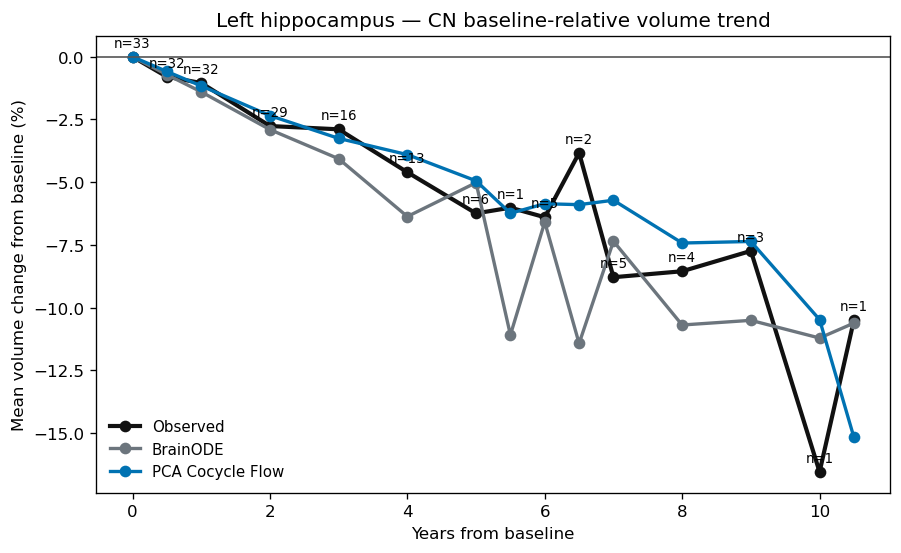

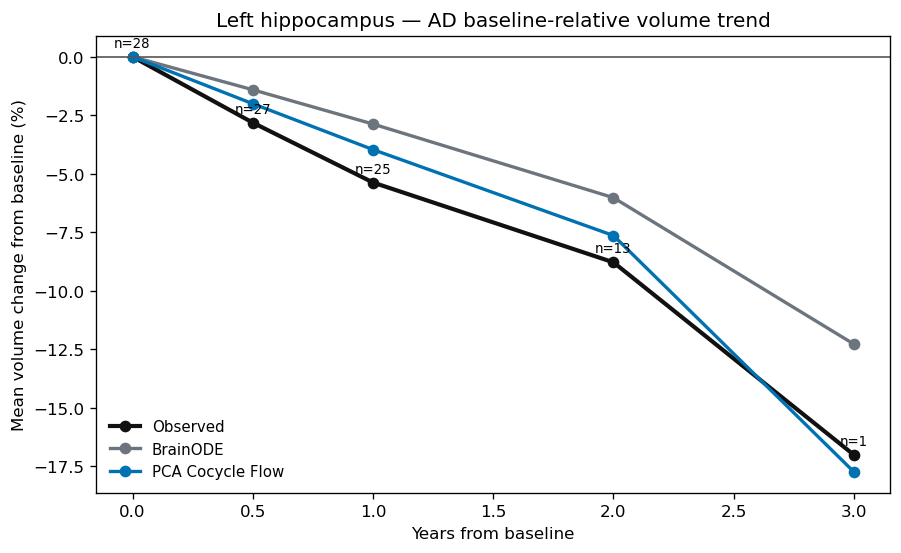

### Left lateral ventricle — individual slopes

,diagnosis,model_label,subjects,observed_slope_mean,predicted_slope_mean,slope_absolute_error_mean,slope_pearson,observed_mm3_per_year_mean,predicted_mm3_per_year_mean
0,AD,BrainODE,28,0.090636,0.036717,0.060419,-0.239239,2388.545914,934.571835
1,AD,PCA Cocycle Flow,28,0.090636,0.075362,0.043430,0.033475,2388.545914,1790.058803
2,CN,BrainODE,33,0.036220,0.034802,0.018403,0.021092,743.343344,816.313614
3,CN,PCA Cocycle Flow,33,0.036220,0.035368,0.015071,0.300669,743.343344,710.118458


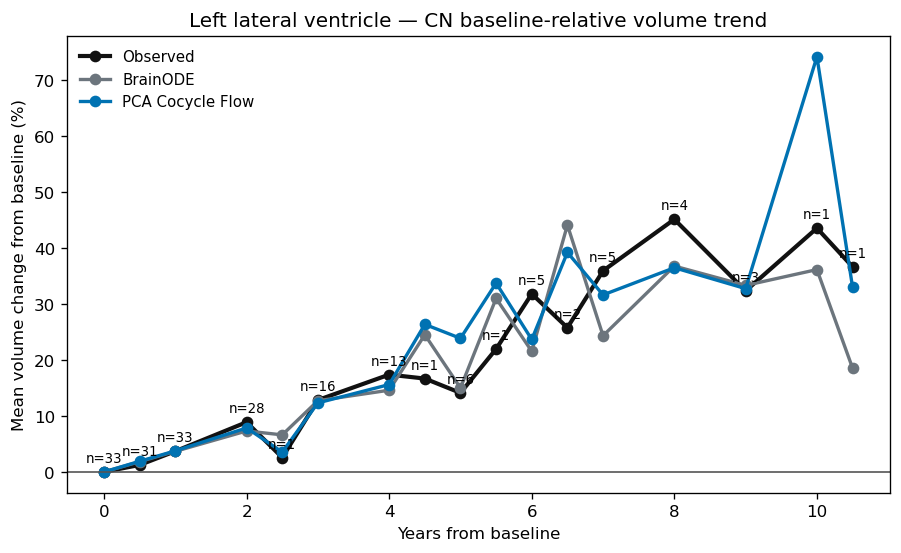

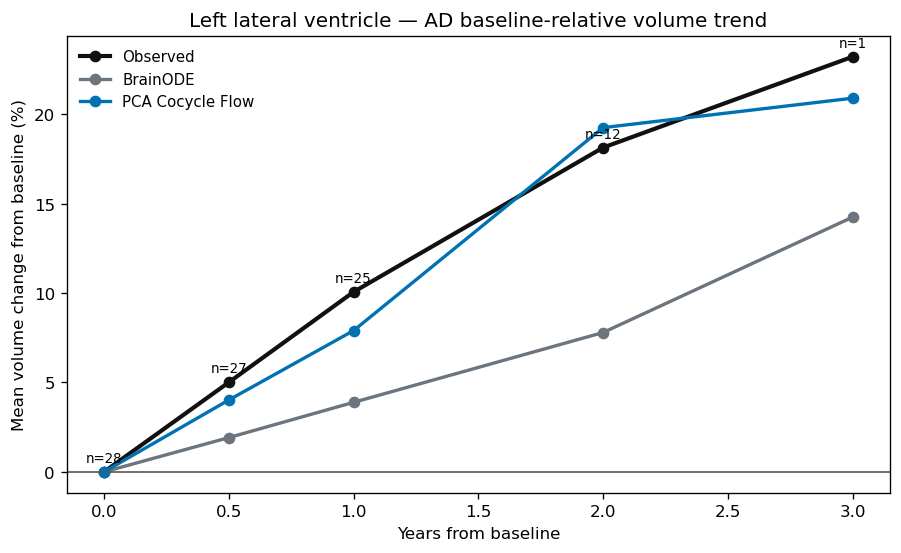

In [7]:
for structure, bundle in bundles.items():
    display(Markdown(f"### {STRUCTURE_LABELS[structure]} — individual slopes"))
    slopes = bundle['tables']['cohort_volume_trend_summary'].query("split == 'test'").copy()
    slope_columns = ['diagnosis', 'model_label', 'subjects', 'observed_slope_mean', 'predicted_slope_mean', 'slope_absolute_error_mean', 'slope_pearson', 'observed_mm3_per_year_mean', 'predicted_mm3_per_year_mean']
    display(slopes.loc[:, slope_columns].reset_index(drop=True))
    curve = bundle['tables']['cohort_volume_curve'].query("split == 'test'")
    for diagnosis in ('CN', 'AD'):
        fig, ax = plt.subplots(figsize=(7.4, 4.5), constrained_layout=True)
        current = curve[curve['diagnosis'] == diagnosis]
        observed = current.groupby('elapsed_year_bin', as_index=False).agg(relative=('observed_relative_volume_mean', 'mean'), subjects=('subjects', 'max'))
        ax.plot(observed['elapsed_year_bin'], 100 * (observed['relative'] - 1), color=MODEL_COLORS['observed'], linewidth=2.5, marker='o', label='Observed')
        for model in ('brainode', 'cocycle_flow'):
            item = current[current['model'] == model].sort_values('elapsed_year_bin')
            ax.plot(item['elapsed_year_bin'], 100 * (item['predicted_relative_volume_mean'] - 1), color=MODEL_COLORS[model], linewidth=2, marker='o', label=MODEL_LABELS[model])
        for item in observed.itertuples(index=False):
            ax.annotate(f'n={item.subjects}', (item.elapsed_year_bin, 100 * (item.relative - 1)), xytext=(0, 6), textcoords='offset points', ha='center', fontsize=8)
        ax.axhline(0, color='#555555', linewidth=1)
        ax.set_title(f"{STRUCTURE_LABELS[structure]} — {diagnosis} baseline-relative volume trend")
        ax.set_xlabel('Years from baseline')
        ax.set_ylabel('Mean volume change from baseline (%)')
        ax.legend(frameon=False)
        plt.show()

## Representative observed trajectories and conditioned forecasts

CN and AD examples are selected deterministically: most follow-up visits, then longest follow-up, then subject ID. Diagnosis-conditioned forecasts are model outputs, not causal disease-conversion statements.

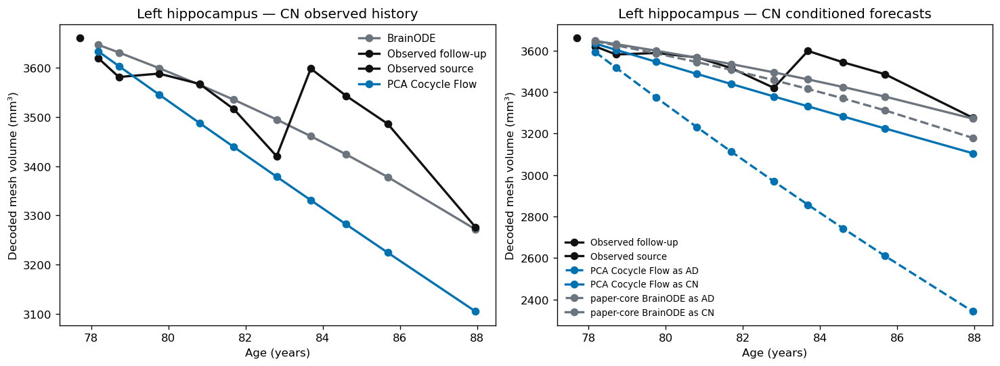

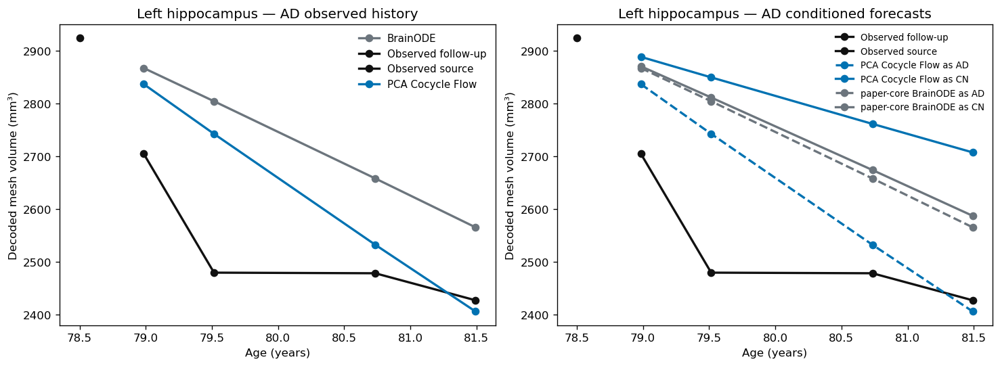

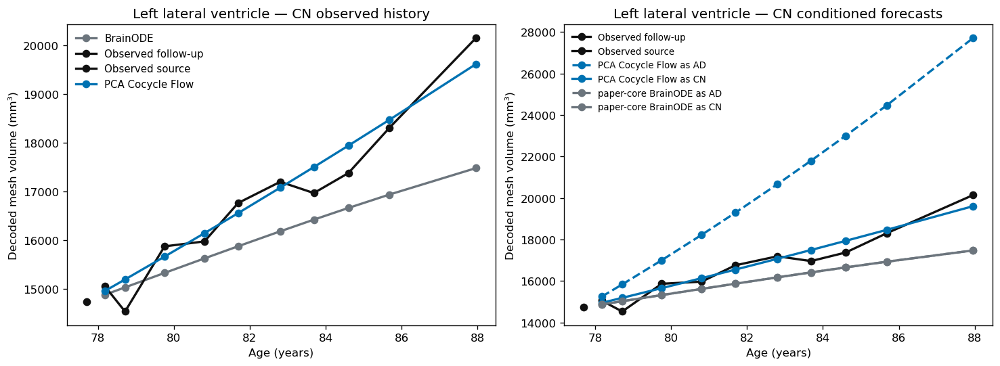

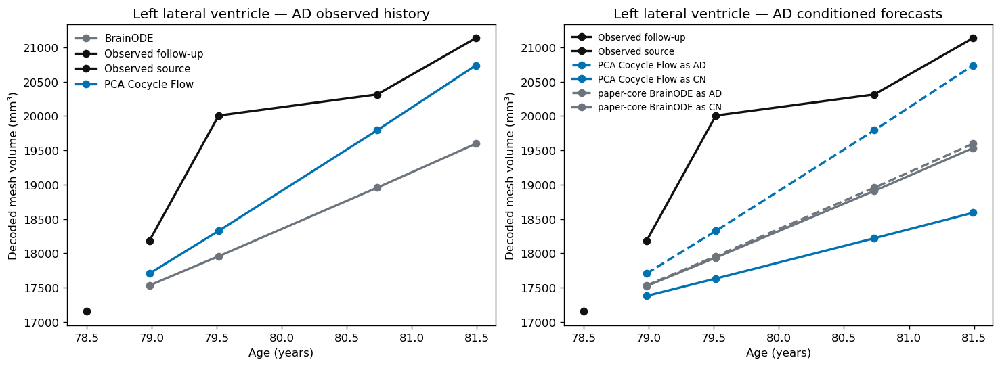

In [8]:
for structure, bundle in bundles.items():
    for diagnosis in ('CN', 'AD'):
        fig, axes = plt.subplots(1, 2, figsize=(12.2, 4.4), constrained_layout=True)
        history = bundle['tables']['selected_volume_trajectories'].query("diagnosis == @diagnosis")
        for series, group in history.groupby('series'):
            model = group['model'].iloc[0]
            axes[0].plot(group['age_years'], group['volume_mm3'], marker='o', linewidth=2, color=MODEL_COLORS[model], label=series)
        axes[0].set_title(f"{STRUCTURE_LABELS[structure]} — {diagnosis} observed history")
        axes[0].set_xlabel('Age (years)'); axes[0].set_ylabel('Decoded mesh volume (mm³)'); axes[0].legend(frameon=False)
        counterfactual = bundle['tables']['counterfactual_trajectories'].query("diagnosis == @diagnosis")
        for series, group in counterfactual.groupby('series'):
            model = group['model'].iloc[0]
            linestyle = '-' if model == 'observed' or group['condition'].iloc[0] == 'CN' else '--'
            axes[1].plot(group['age_years'], group['volume_mm3'], marker='o', linestyle=linestyle, linewidth=2, color=MODEL_COLORS[model], label=series)
        axes[1].set_title(f"{STRUCTURE_LABELS[structure]} — {diagnosis} conditioned forecasts")
        axes[1].set_xlabel('Age (years)'); axes[1].set_ylabel('Decoded mesh volume (mm³)'); axes[1].legend(frameon=False, fontsize=8)
        plt.show()

## Paired case distribution and 3D local-change maps

Mesh panels use the shared correspondence topology. Group change maps average pairs within each subject before averaging subjects, preventing longer follow-up histories from dominating the group result.

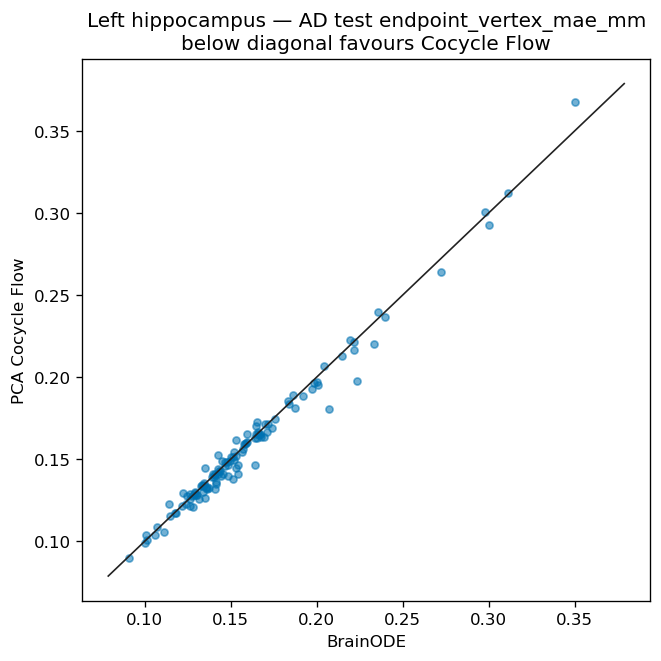

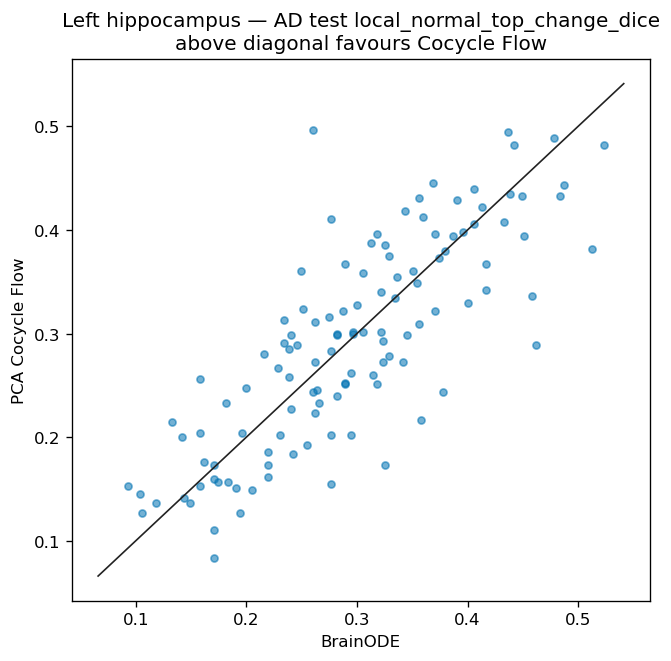

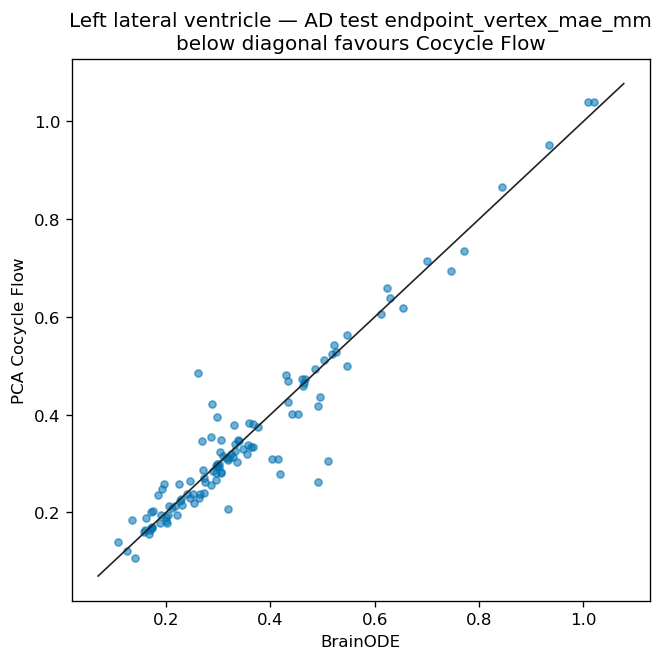

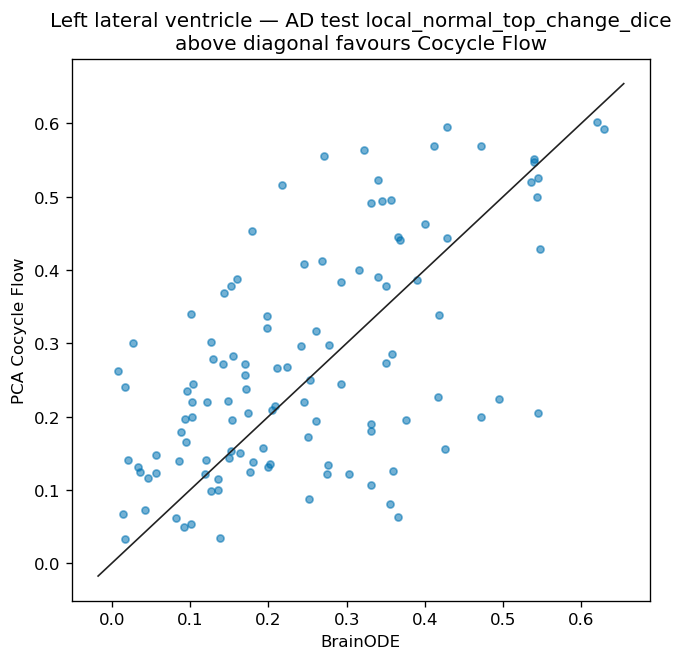

,diagnosis,subject_id,gap_years,model,model_label,vertex_error_mean,normal_change_mae,normal_change_pearson,hotspot_dice
0,CN,31,10.255989,brainode,BrainODE,0.282737,0.018570,0.331412,0.183636
1,CN,31,10.255989,cocycle_flow,PCA Cocycle Flow,0.344557,0.022926,0.383217,0.300000
2,AD,995,2.992470,brainode,BrainODE,0.346672,0.077935,0.521541,0.374545
3,AD,995,2.992470,cocycle_flow,PCA Cocycle Flow,0.336861,0.080375,0.418377,0.372727


,diagnosis,model,model_label,pairs,subjects,aggregation,normal_change_mae,normal_change_pearson,hotspot_dice,top_fraction
0,CN,brainode,BrainODE,4269,326,"mean within subject, then mean across subjects",0.007764,0.906641,0.769091,0.2
1,CN,cocycle_flow,PCA Cocycle Flow,4269,326,"mean within subject, then mean across subjects",0.007133,0.913037,0.743636,0.2
2,AD,brainode,BrainODE,1107,271,"mean within subject, then mean across subjects",0.024789,0.896323,0.778182,0.2
3,AD,cocycle_flow,PCA Cocycle Flow,1107,271,"mean within subject, then mean across subjects",0.015169,0.943482,0.836364,0.2


,diagnosis,subject_id,gap_years,model,model_label,vertex_error_mean,normal_change_mae,normal_change_pearson,hotspot_dice
0,CN,31,10.255989,brainode,BrainODE,0.746736,0.055668,0.321071,0.295808
1,CN,31,10.255989,cocycle_flow,PCA Cocycle Flow,0.388516,0.024230,0.732978,0.547904
2,AD,995,2.992470,brainode,BrainODE,0.886353,0.172188,-0.164047,0.104192
3,AD,995,2.992470,cocycle_flow,PCA Cocycle Flow,0.783779,0.145130,0.218267,0.243713


,diagnosis,model,model_label,pairs,subjects,aggregation,normal_change_mae,normal_change_pearson,hotspot_dice,top_fraction
0,CN,brainode,BrainODE,4260,323,"mean within subject, then mean across subjects",0.039000,0.592629,0.649102,0.2
1,CN,cocycle_flow,PCA Cocycle Flow,4260,323,"mean within subject, then mean across subjects",0.034397,0.761734,0.695808,0.2
2,AD,brainode,BrainODE,1136,276,"mean within subject, then mean across subjects",0.177338,0.879053,0.802994,0.2
3,AD,cocycle_flow,PCA Cocycle Flow,1136,276,"mean within subject, then mean across subjects",0.043218,0.925143,0.792216,0.2


In [9]:
for structure, bundle in bundles.items():
    paired = bundle['tables']['paired_metric_comparison']
    for metric in ('endpoint_vertex_mae_mm', 'local_normal_top_change_dice'):
        data = paired.query("split == 'test' and diagnosis == 'AD' and metric == @metric")
        if data.empty:
            continue
        low = np.nanmin(data[['brainode_value', 'cocycle_flow_value']].to_numpy())
        high = np.nanmax(data[['brainode_value', 'cocycle_flow_value']].to_numpy())
        pad = 0.04 * max(high - low, 1.0e-8)
        fig, ax = plt.subplots(figsize=(5.4, 5.4), constrained_layout=True)
        ax.scatter(data['brainode_value'], data['cocycle_flow_value'], s=18, alpha=0.55, color=MODEL_COLORS['cocycle_flow'])
        ax.plot([low - pad, high + pad], [low - pad, high + pad], color='#222222', linewidth=1)
        relation = 'below' if data['direction'].iloc[0] == 'lower' else 'above'
        ax.set_title(f"{STRUCTURE_LABELS[structure]} — AD test {metric}\n{relation} diagonal favours Cocycle Flow")
        ax.set_xlabel('BrainODE'); ax.set_ylabel('PCA Cocycle Flow')
        plt.show()

if go is None:
    print('Install plotly to render interactive mesh panels.')
else:
    def read_faces(bundle):
        return pd.read_csv(bundle['cache'] / 'meshes' / 'template_faces.csv')

    def selected_mesh_figure(structure, diagnosis):
        bundle = bundles[structure]
        frame = pd.read_csv(bundle['cache'] / 'meshes' / f"selected_{diagnosis.lower()}_vertices.csv")
        faces = read_faces(bundle)
        maximum = np.nanpercentile(np.r_[frame['brainode_endpoint_error'], frame['cocycle_flow_endpoint_error']], 98)
        fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'scene'}] * 2] * 2, subplot_titles=['Source', 'Observed future', 'BrainODE endpoint error', 'Cocycle Flow endpoint error'])
        panels = [(('source_x', 'source_y', 'source_z'), None), (('target_x', 'target_y', 'target_z'), None), (('brainode_x', 'brainode_y', 'brainode_z'), 'brainode_endpoint_error'), (('cocycle_flow_x', 'cocycle_flow_y', 'cocycle_flow_z'), 'cocycle_flow_endpoint_error')]
        for position, (xyz, error) in enumerate(panels, start=1):
            row, col = divmod(position - 1, 2); row += 1; col += 1
            options = dict(x=frame[xyz[0]], y=frame[xyz[1]], z=frame[xyz[2]], i=faces['vertex_0'], j=faces['vertex_1'], k=faces['vertex_2'], flatshading=False, hoverinfo='skip')
            if error is None:
                options['color'] = '#D9D9D9'
            else:
                options.update(intensity=frame[error], colorscale='Inferno', cmin=0, cmax=maximum, showscale=(position == 4))
            fig.add_trace(go.Mesh3d(**options), row=row, col=col)
        fig.update_scenes(aspectmode='data', xaxis_visible=False, yaxis_visible=False, zaxis_visible=False)
        fig.update_layout(title=f"{STRUCTURE_LABELS[structure]} — {diagnosis} selected shape progression", height=760, margin=dict(l=5, r=5, t=65, b=5))
        fig.show()

    def group_map_figure(structure, diagnosis):
        bundle = bundles[structure]
        frame = pd.read_csv(bundle['cache'] / 'meshes' / f"group_{diagnosis.lower()}_change_maps.csv")
        if frame.empty:
            print(f'{STRUCTURE_LABELS[structure]} {diagnosis}: group maps were skipped.')
            return
        faces = read_faces(bundle)
        fields = ('observed_normal_change_rate', 'brainode_normal_change_rate', 'cocycle_flow_normal_change_rate')
        maximum = np.nanpercentile(np.abs(frame[list(fields)].to_numpy()), 98)
        fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'scene'}] * 3], subplot_titles=['Observed group change', 'BrainODE group change', 'Cocycle Flow group change'])
        for col, field in enumerate(fields, start=1):
            fig.add_trace(go.Mesh3d(x=frame['template_x'], y=frame['template_y'], z=frame['template_z'], i=faces['vertex_0'], j=faces['vertex_1'], k=faces['vertex_2'], intensity=frame[field], colorscale='RdBu', cmin=-maximum, cmax=maximum, flatshading=False, hoverinfo='skip', showscale=(col == 3)), row=1, col=col)
        fig.update_scenes(aspectmode='data', xaxis_visible=False, yaxis_visible=False, zaxis_visible=False)
        fig.update_layout(title=f"{STRUCTURE_LABELS[structure]} — {diagnosis} subject-balanced local change", height=430, margin=dict(l=5, r=5, t=65, b=5))
        fig.show()

    for structure in STRUCTURES:
        for diagnosis in ('CN', 'AD'):
            selected_mesh_figure(structure, diagnosis)
            group_map_figure(structure, diagnosis)
        display(bundles[structure]['tables']['selected_mesh_metrics'])
        display(bundles[structure]['tables']['group_hotspot_metrics'])

## Interpretation checklist

- Make primary claims from the held-out test split.
- Report paired subject-bootstrap confidence intervals, not only mean differences.
- Treat local surface-change maps as correspondence-based accuracy measures, not diagnostic biomarkers.
- Do not treat individual slope estimates from short sequences as a reliable ranking of personal disease speed.
- Diagnosis-conditioned forecasts are not causal conversion trajectories.
- Do not select a checkpoint using the test tables in this notebook.